In [1]:
import json
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm.auto import tqdm
import random
import ipyplot
import math

from utils import *

load_dotenv()
Migrator().run()

In [2]:
query = "wedding*moose"
models = Model.find(Model.filename % query).all()
models = [model for model in models if model.faces]

In [3]:
triton_client = grpcclient.InferenceServerClient(url=TRITON_SERVER_URL, verbose=False)

model_metadata = triton_client.get_model_metadata(
    model_name=FPENET_MODEL_NAME, model_version=MODEL_VERSION
)

model_config = triton_client.get_model_config(
    model_name=FPENET_MODEL_NAME, model_version=MODEL_VERSION
).config

input_names = [i.name for i in model_config.input]
output_names = [i.name for i in model_config.output]
print("expected input names:{}".format(input_names))

print("expected output names:{}".format(output_names))

expected input names:['raw_image_data', 'true_boxes']
expected output names:['conv_keypoints_m80', 'softargmax', 'softargmax:1']


In [4]:
pbar = tqdm(
    total=len(models),
    desc="Submitting photos to {} at {}".format(FPENET_MODEL_NAME, TRITON_SERVER_URL),
)

results = []

with ThreadPoolExecutor() as executor:
    for chunk in chunked(models, THREAD_CHUNKS):
        futures = []
        for model in chunk:
            if model.faces:
                futures.append(
                    executor.submit(
                        submit_to_fpenet,
                        model,
                    )
                )

        for future in as_completed(futures):
            pbar.update()
            try:
                infer_results = future.result()
                for i, infer_result in enumerate(infer_results):
                    model = Model.get(infer_result.get_response().id)
                    image_points = infer_result.as_numpy(output_names[1]).squeeze()
                    model.faces[i].rotation = get_fpenet_rotation(image_points)
                    model.faces[i].descriptors = parse_descriptors(image_points)
                    model.save()

            except Exception as e:
                print(
                    "There was an exception: {} {}.".format(
                        infer_result.get_response().id, e
                    )
                )

Submitting photos to fpenet_ensemble at 172.25.4.42:8001:   0%|          | 0/356 [00:00<?, ?it/s]

/workspace/utils.py:147: RuntimeWarning: divide by zero encountered in double_scalars
  tan = (right_ys - left_ys) / (right_xs - left_xs)


Looks like /volume1/brandon/pictures/2015-wedding-moose-photos/ab_hawk_hollow_wedding_lansing-791.jpeg has 4 faces.



/usr/local/lib/python3.8/dist-packages/ipyplot/_utils.py:95: FutureWarning: The input object of type 'Image' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Image', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  return np.asarray(seq, dtype=type(seq[0]))



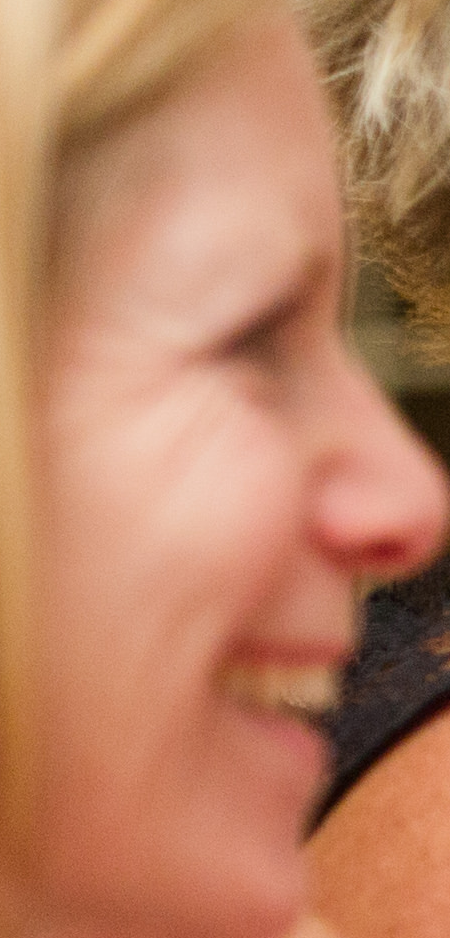
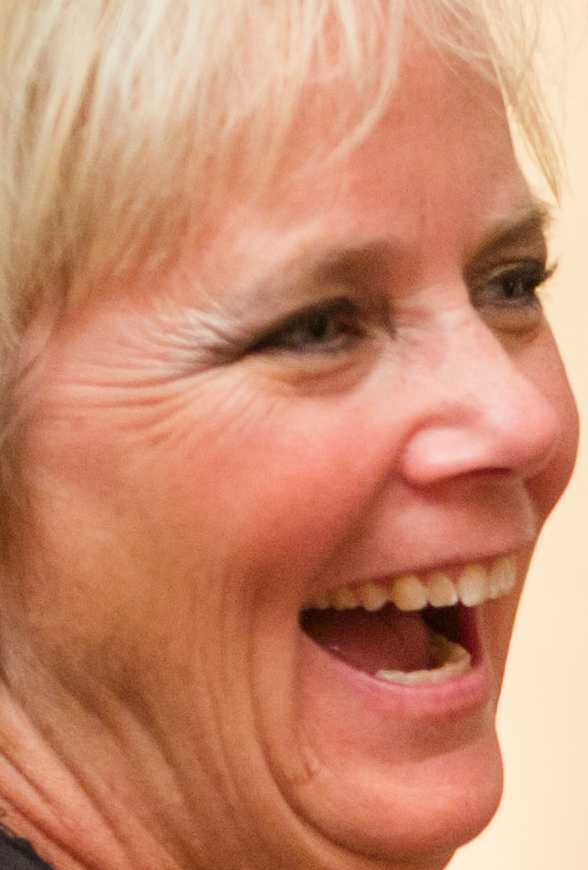
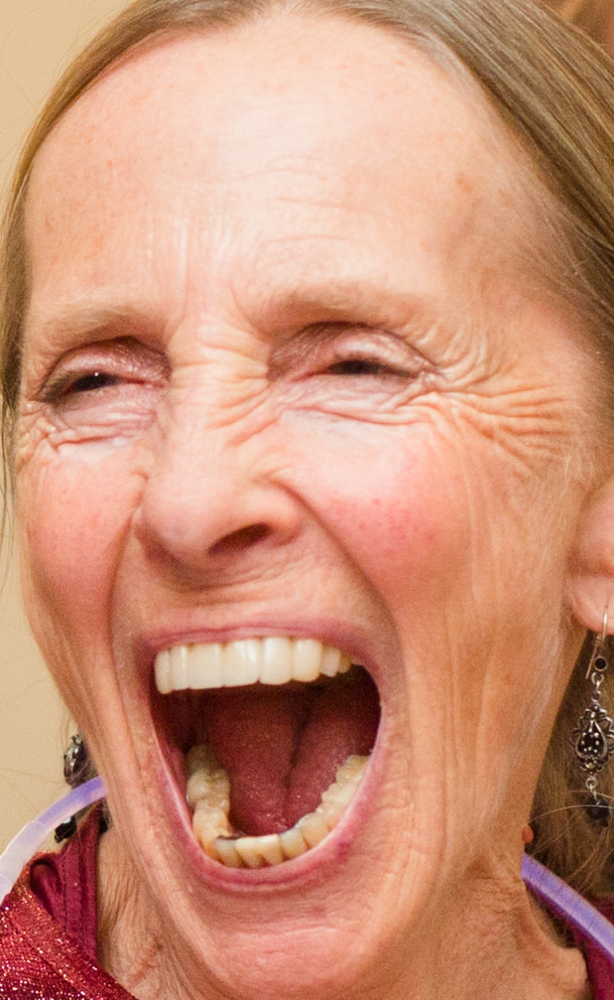
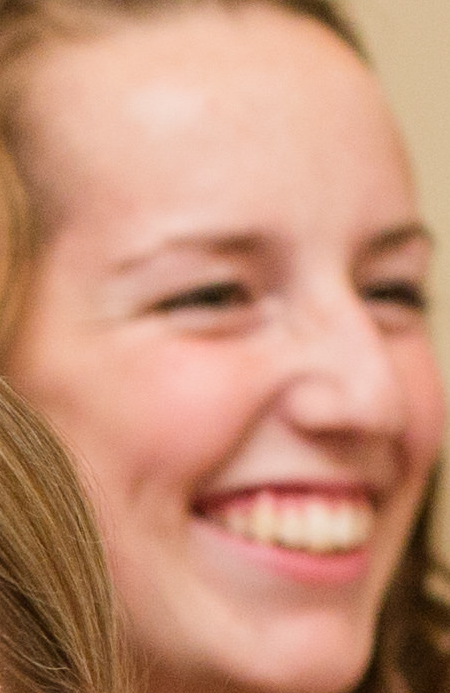


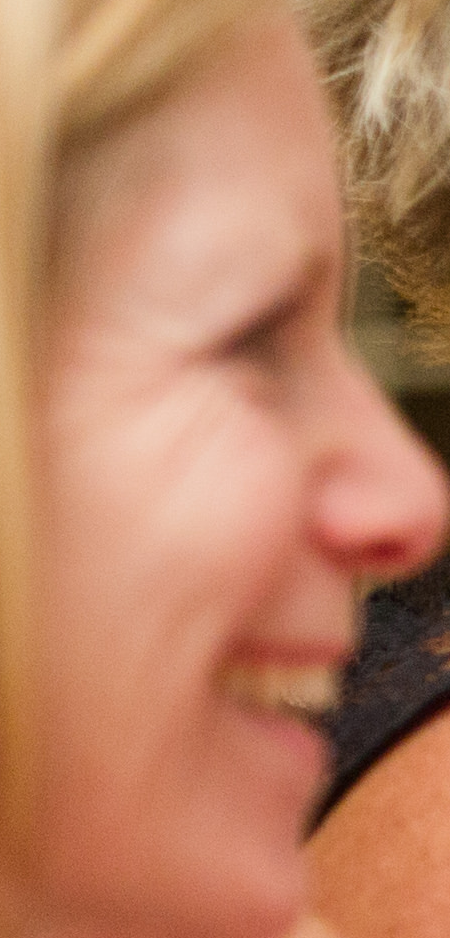
...
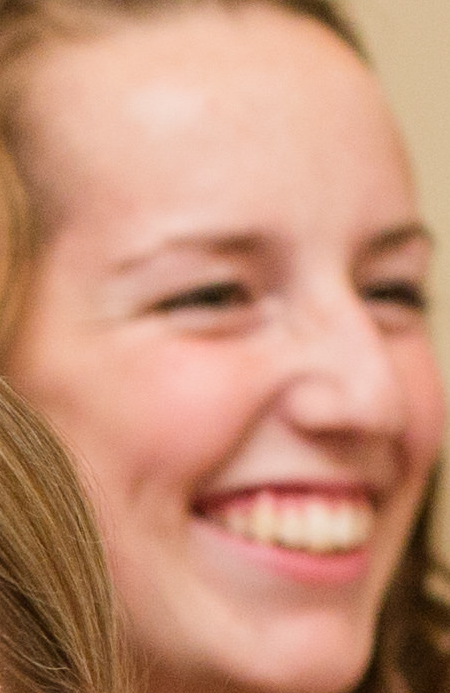


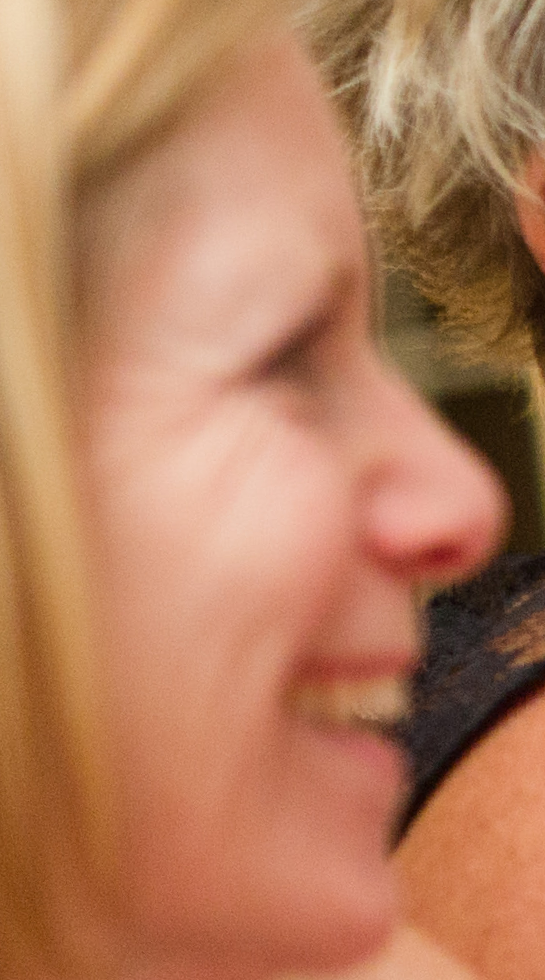
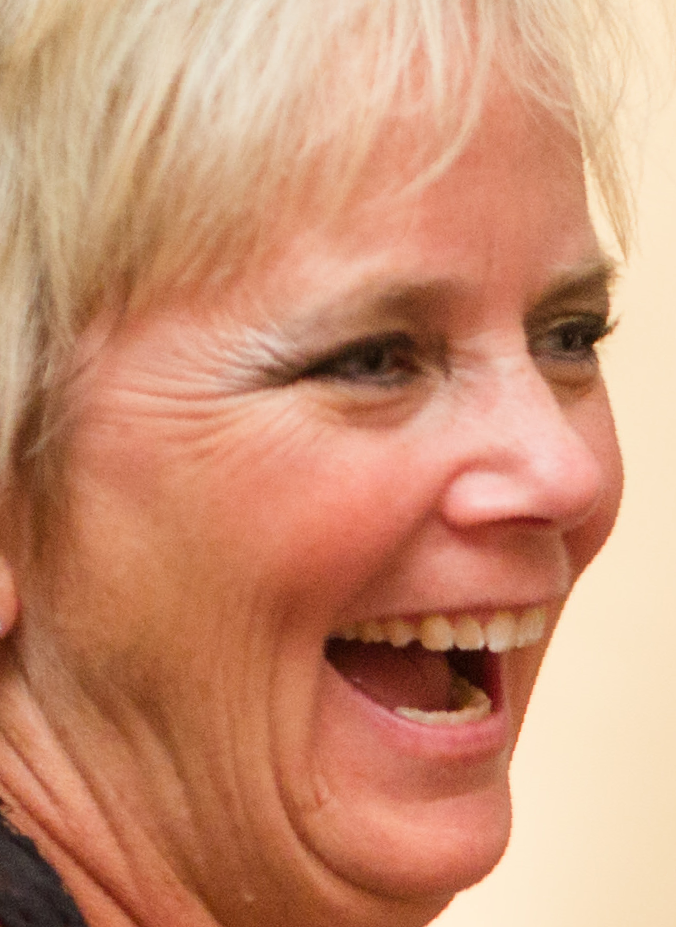
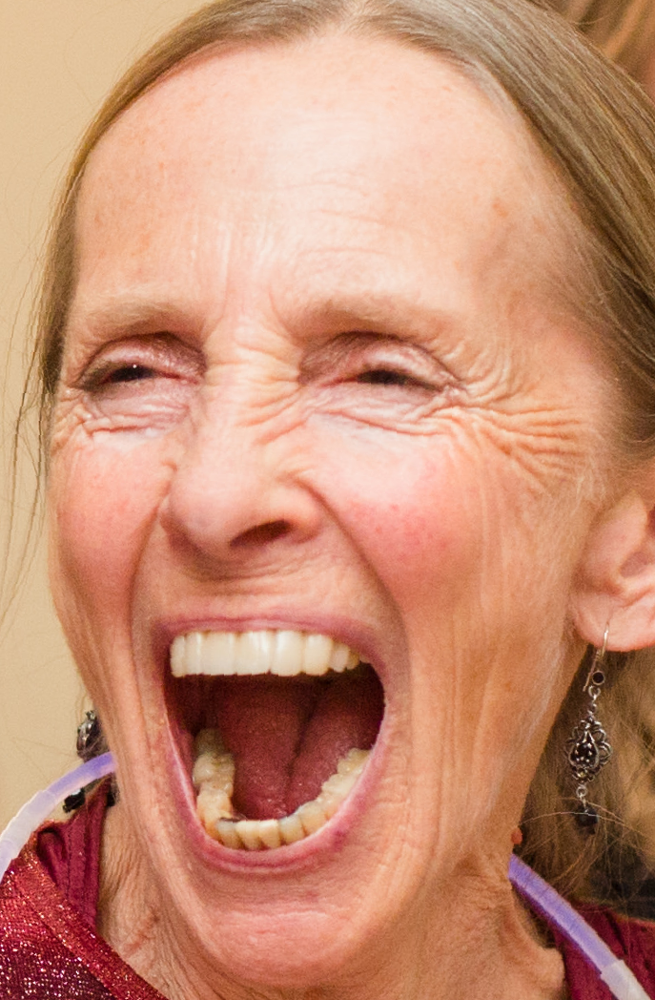
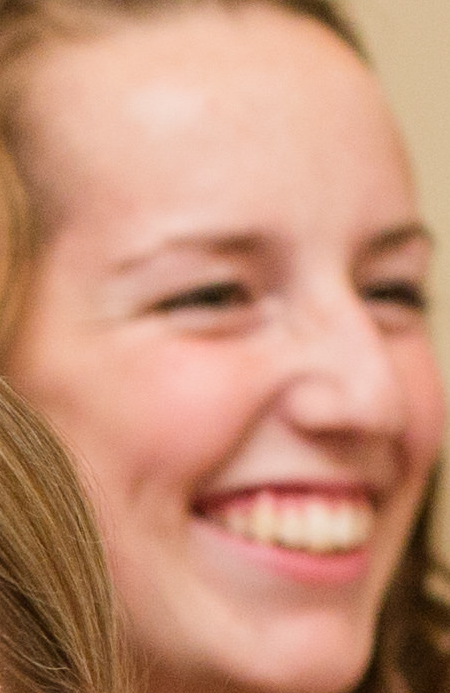

In [5]:
models = Model.find(Model.filename % query).all()
models = [model for model in models if model.faces]
random.shuffle(models)

for model in models:
    if len(model.faces) >= 4:
        print("Looks like {} has {} faces.\n".format(model.filename, len(model.faces)))
        original_crops = crop_and_rotate_clip(model)
        model = new_rotated_bbox(model)
        modified_crops = crop_and_rotate_clip(model, rotate=True)
        break
    else:
        continue


ipyplot.plot_images(
    original_crops, labels=["0\N{DEGREE SIGN} rotation" for face in model.faces]
)
ipyplot.plot_images(
    modified_crops,
    labels=["{}\N{DEGREE SIGN} rotation".format(face.rotation) for face in model.faces],
)